In [1]:
from PIL import Image
from pillow_heif import register_heif_opener
import torch
import torch.nn as nn
import numpy as np
import torchvision.transforms as transforms 
import time
import random

register_heif_opener()

image = Image.open('data/IMG_1432.HEIC')

print(image.size)
print(image.mode)

(8141, 1917)
RGB


In [2]:
DEVICE = 'mps'

transform = transforms.Compose([ 
    transforms.PILToTensor() 
])

img_tensor = transform(image)
img_tensor = img_tensor.to(torch.float) / 255.0

print(img_tensor.shape)

torch.Size([3, 1917, 8141])


In [3]:
IMAGE_CHANNELS = 3
SLICES = 100

# calculate slice width
slice_width = img_tensor.shape[2] // SLICES
slice_height = img_tensor.shape[1]
slice_shape = (IMAGE_CHANNELS, slice_height, slice_width)
# note that we are no longer flattening the slices because our 2D inputs will go
# to a conv layer

hidden_size = 512
latent_size = 128
conv_1_out = 8
conv_2_out = 16
conv_3_out = 24

print(f'Slice Shape: {slice_shape}')

Slice Shape: (3, 1917, 81)


In [4]:
# encoder portion. will take our slices and (learn to) encode them into the latent space
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        # conv output is (8, slice_height, slice_width)
        self.conv1 = nn.Conv2d(in_channels=IMAGE_CHANNELS, out_channels=conv_1_out, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels=conv_1_out, out_channels=conv_2_out, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(in_channels=conv_2_out, out_channels=conv_3_out, kernel_size=3, stride=1, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=3, stride=2) # (conv_3_out, 958, 40)
        self.flatten = nn.Flatten() # (conv_3_out*958*40)
        self.norm1 = nn.LayerNorm([conv_3_out*958*40])
        self.relu = nn.ReLU()
        self.linear = nn.Linear(conv_3_out*958*40, hidden_size)
        self.norm2 = nn.LayerNorm([hidden_size])
        self.mean = nn.Linear(hidden_size, latent_size)
        self.var = nn.Linear(hidden_size, latent_size)
        
    def forward(self, x):
        x = self.relu(self.conv1(x))
        #print(f'conv1 out shape: {x.shape}')
        x = self.relu(self.conv2(x))
        #print(f'conv2 out shape: {x.shape}')
        x = self.relu(self.conv3(x))
        #print(f'conv3 out shape: {x.shape}')
        x = self.pool1(x)
        x = self.flatten(x)
        x = self.relu(self.norm1(x))
        x = self.relu(self.norm2(self.linear(x)))
        
        mean = self.mean(x)
        log_variance = self.var(x)
        
        return mean, log_variance

# decoder portion. takes data that is normally distributed in the latent space
# and decodes to the input space
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        
        self.latent_in = nn.Linear(latent_size, hidden_size)
        self.hidden_layer = nn.Linear(hidden_size, conv_3_out*958*40)
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(conv_3_out,958,40))
        self.unconv3 = nn.ConvTranspose2d(in_channels=conv_3_out, out_channels=conv_2_out, kernel_size=3, stride=2, 
                                         padding=1, output_padding=2)
        self.unconv2 = nn.ConvTranspose2d(in_channels=conv_2_out, out_channels=conv_1_out, kernel_size=3, stride=1, 
                                         padding=1, output_padding=0)
        self.unconv1 = nn.ConvTranspose2d(in_channels=conv_1_out, out_channels=IMAGE_CHANNELS, kernel_size=3, stride=1, 
                                         padding=1, output_padding=0)
        self.norm1 = nn.LayerNorm([hidden_size])
        self.norm2 = nn.LayerNorm([conv_3_out*958*40])
        
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu(self.norm1(self.latent_in(x)))
        x = self.relu(self.norm2(self.hidden_layer(x)))
        x = self.relu(self.unflatten(x))
        x = self.unconv3(x)
        #print(f'uc3 shape: {x.shape}')
        x = self.unconv2(x)
        #print(f'uc2 shape: {x.shape}')
        x = self.unconv1(x)
        #print(f'uc1 shape: {x.shape}')
        x = self.sigmoid(x)
        
        return x
    
# puts it all together and adds the reparameterization trick to 
# establish the Gaussian distribution
class VAETrainingModel(nn.Module):
    def __init__(self, encoder, decoder):
        super(VAETrainingModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
    
    def reparameterize(self, mean, var):
        epsilon = torch.randn_like(var).to(DEVICE)
        return mean + epsilon * var
        
    def forward(self, x):
        mean, log_var = self.encoder(x)
        x = self.reparameterize(mean, log_var)
        x = self.decoder(x)
        
        return x, mean, log_var
    
def cost_function(x, x_pred, mean, log_var):
    reproduction_loss = nn.functional.mse_loss(x_pred, x)
    KLD      = - 0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD

In [5]:
BATCH_SIZE = 10
EPOCH_ITERS = img_tensor.shape[2] // slice_width // BATCH_SIZE
MODEL_WEIGHTS_FILE = 'out/model_conv.pt'

# train the model on the flattened data
def train_model(model, next_batch, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_loss = np.inf
    best_epoch = 0

    phases = ['train', 'val']

    # Keep track of how loss evolves during training
    training_curves = {}
    for phase in phases:
        training_curves[phase+'_loss'] = []

    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in phases:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0

            # Iterate over data - for the autoencoder we don't care about the
            # labels, we are training the input against itself!
            for _ in range(EPOCH_ITERS):
                inputs = next_batch(BATCH_SIZE)
                # Important! We need to flatten every datapoint to be
                # compatible with our model!
                inputs = inputs.to(DEVICE)
                # our targets are the same as our inputs!
                targets = inputs.to(DEVICE)
                # print(inputs.shape)
                # print(targets.shape)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                with torch.set_grad_enabled(phase == 'train'):
                    x_pred, mean, log_var = model(inputs)
                    # print(outputs.shape)
                    loss = criterion(targets, x_pred, mean, log_var)

                    # backward + update weights only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / BATCH_SIZE
            training_curves[phase+'_loss'].append(epoch_loss)

            print(f'{phase:5} Loss: {epoch_loss:.4f}')

            # deep copy the model if it's the best loss
            if phase == 'val' and epoch_loss < best_loss:
              best_epoch = epoch
              best_loss = epoch_loss
              with open(MODEL_WEIGHTS_FILE, 'wb') as f:
                # Use torch.save with a file-like object
                torch.save(model.state_dict(), f)

    time_elapsed = time.time() - since
    print(f'\nTraining complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Loss: {best_loss:4f} at epoch {best_epoch}')

    # load best model weights
    model.load_state_dict(torch.load(MODEL_WEIGHTS_FILE, map_location=DEVICE))

    return model, training_curves

In [6]:
LEARNING_RATE = 1e-3

encoder = Encoder().to(DEVICE)
print('Encoder: ', sum(p.numel() for p in encoder.parameters())/1e6, 'M parameters')
decoder = Decoder().to(DEVICE)
print('Decoder: ', sum(p.numel() for p in decoder.parameters())/1e6, 'M parameters')
training_model = VAETrainingModel(encoder, decoder).to(DEVICE)

optimizer_ = torch.optim.AdamW(training_model.parameters(), lr=LEARNING_RATE, weight_decay=1e-5)
scheduler_ = torch.optim.lr_scheduler.ExponentialLR(optimizer_, gamma=0.95)

Encoder:  630.431096 M parameters
Decoder:  631.591515 M parameters


In [7]:
def get_batch(batch_size):
    """ Returns a batch consisting of batch_size slices of the training data """
    # our img_tensor is torch.Size([3, 1917, 8141])
    # so we want to start at a random spot in the tensor that is < slice_width
    # then take a slice_width chunk of the 3rd dimension which is the width
    
    # calculate the maximum start index for the width
    max_start_index_width = img_tensor.size(2) - slice_width

    batch_list = []
    for _ in range(batch_size):
        start = random.randint(0, max_start_index_width)
        img_slice = img_tensor[:, :, start:start + slice_width]
        #print(f'Random tensor of size {img_slice.shape} width at {start} ')
        batch_list.append(img_slice)
        
    ret = torch.stack(batch_list)
    #print(ret.shape)
    return ret

In [8]:
EPOCHS = 15
train_model(training_model, get_batch, cost_function, optimizer_, scheduler_, EPOCHS)


Epoch 1/15
----------
train Loss: 587.4605
val   Loss: 136.0489

Epoch 2/15
----------
train Loss: 77.2650
val   Loss: 38.4267

Epoch 3/15
----------
train Loss: 24.2314
val   Loss: 10.6933

Epoch 4/15
----------
train Loss: 6.5981
val   Loss: 3.9167

Epoch 5/15
----------
train Loss: 2.5274
val   Loss: 1.5387

Epoch 6/15
----------
train Loss: 1.0399
val   Loss: 0.6938

Epoch 7/15
----------
train Loss: 0.4856
val   Loss: 0.3712

Epoch 8/15
----------
train Loss: 0.2864
val   Loss: 0.2520

Epoch 9/15
----------
train Loss: 0.2438
val   Loss: 0.2195

Epoch 10/15
----------
train Loss: 0.2133
val   Loss: 0.2036

Epoch 11/15
----------
train Loss: 0.2006
val   Loss: 0.2116

Epoch 12/15
----------
train Loss: 0.2137
val   Loss: 0.2002

Epoch 13/15
----------
train Loss: 0.2010
val   Loss: 0.2056

Epoch 14/15
----------
train Loss: 0.1991
val   Loss: 0.2012

Epoch 15/15
----------
train Loss: 0.1883
val   Loss: 0.2038

Training complete in 1m 52s
Best val Loss: 0.200222 at epoch 11


(VAETrainingModel(
   (encoder): Encoder(
     (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (conv2): Conv2d(16, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (conv3): Conv2d(24, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     (pool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
     (flatten): Flatten(start_dim=1, end_dim=-1)
     (norm1): LayerNorm((1226240,), eps=1e-05, elementwise_affine=True)
     (relu): ReLU()
     (linear): Linear(in_features=1226240, out_features=512, bias=True)
     (norm2): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
     (mean): Linear(in_features=512, out_features=128, bias=True)
     (var): Linear(in_features=512, out_features=128, bias=True)
   )
   (decoder): Decoder(
     (latent_in): Linear(in_features=128, out_features=512, bias=True)
     (hidden_layer): Linear(in_features=512, out_features=1226240, bias=True)
     (unflatten): Unflatten(dim=1, unflat

In [9]:
import math
# sample images from the latent space
import matplotlib.pyplot as plt
from matplotlib import gridspec

def stitch_and_show_images(x):
    """
    Stitch image slices horizontally and show the resulting single image.

    :param x: Tensor containing the image slices.
    :param slice_shape: Shape of each slice (channels, height, width).
    """
    x = x.view(-1, *slice_shape)  # Reshape
    x = x.permute(0, 2, 3, 1)     # Reorder dimensions for plotting

    # Concatenate all slices horizontally
    stitched_image = torch.cat(tuple(x), dim=1)
    
    # Calculate the full size for displaying
    full_width = stitched_image.shape[1]
    full_height = stitched_image.shape[0]
    dpi = 80  # Adjust dpi to your screen for accurate sizing (default is usually 80 or 100)
    figsize = full_width / dpi, full_height / dpi
    
    # Convert to numpy and plot
    fig = plt.figure(figsize=figsize, dpi=dpi)
    plt.imshow(stitched_image.cpu().numpy())
    plt.axis('off')
    plt.show()
    
with torch.no_grad():
    noise = torch.randn(SLICES, latent_size).to(DEVICE)
    generated_images = training_model.decoder(noise)

In [10]:
print(generated_images.shape)
print(generated_images)

torch.Size([100, 3, 1917, 81])
tensor([[[[0.8022, 0.8015, 0.8824,  ..., 0.8283, 0.6986, 0.7259],
          [0.8055, 0.8024, 0.8856,  ..., 0.8558, 0.8236, 0.8035],
          [0.7630, 0.8962, 0.8797,  ..., 0.8741, 0.8291, 0.8101],
          ...,
          [0.4494, 0.4774, 0.4537,  ..., 0.4660, 0.4856, 0.4644],
          [0.4670, 0.4859, 0.4400,  ..., 0.4445, 0.4777, 0.4718],
          [0.5109, 0.4949, 0.4950,  ..., 0.5070, 0.5259, 0.5081]],

         [[0.7414, 0.8389, 0.9046,  ..., 0.9091, 0.7156, 0.7835],
          [0.8396, 0.8924, 0.9452,  ..., 0.9551, 0.8125, 0.8297],
          [0.8477, 0.9263, 0.9360,  ..., 0.9347, 0.8419, 0.8314],
          ...,
          [0.5105, 0.4874, 0.5125,  ..., 0.4500, 0.4870, 0.5211],
          [0.5022, 0.4983, 0.4959,  ..., 0.4760, 0.4859, 0.5291],
          [0.5328, 0.5235, 0.4901,  ..., 0.5108, 0.4979, 0.4825]],

         [[0.7761, 0.7941, 0.8359,  ..., 0.8411, 0.6793, 0.7240],
          [0.8989, 0.9050, 0.9110,  ..., 0.9015, 0.8730, 0.7554],
          [

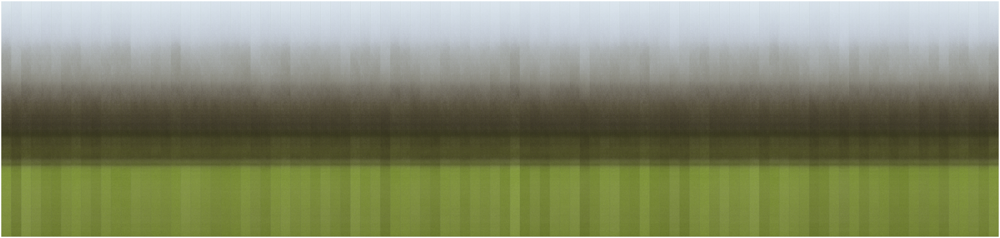

In [11]:
stitch_and_show_images(generated_images)